# Машинное обучение, ФКН ВШЭ

## Практическое задание 3. Градиентный спуск своими руками

### Общая информация
Дата выдачи: **23.10.2023**

Мягкий дедлайн: **08.11.23 23:59**

Жесткий дедлайн: **12.11.23 23:59**

### О задании

В данном задании необходимо реализовать обучение линейной регрессии с помощью различных вариантов градиентного спуска.


### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов + 2 балла бонус.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.
Также оценка может быть снижена за плохо читаемый код и плохо считываемые диаграммы.

Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.


### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-03-gd-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

**Оценка**: 12

Напомним, что на лекциях и семинарах мы разбирали некоторые подходы к оптимизации функционалов по параметрам. В частности, был рассмотрен градиентный спуск и различные подходы к его реализации — полный градиентный спуск, стохастический градиентный спуск, метод импульса и другие. В качестве модели у нас будет выступать линейная регрессия.

В этом домашнем задании вам предстоит реализовать 4 различных вариации градиентного спуска, написать свою реализацию линейной регресии, сравнить методы градиентного спуска между собой на реальных данных и ещё много чего веселого и интересного!

## Задание 1. Реализация градиентного спуска (3.5 балла)

В этом задании вам предстоит написать собственные реализации различных подходов к градиентному спуску с опорой на подготовленные шаблоны в файле `descents.py`.

**Все реализуемые методы должны быть векторизованы!**

### Лирическое-теоретическое отступление № 1

Основное свойство антиградиента &ndash; он указывает в сторону наискорейшего убывания функции в данной точке. Соответственно, будет логично стартовать из некоторой точки, сдвинуться в сторону антиградиента,
пересчитать антиградиент и снова сдвинуться в его сторону и т.д. Запишем это более формально.

Пусть $w_0$ &ndash; начальный набор параметров (например, нулевой или сгенерированный из некоторого
случайного распределения). Тогда ванильный градиентный спуск состоит в повторении следующих шагов до сходимости:

$$
    w_{k + 1} = w_{k} - \eta_{k} \nabla_{w} Q(w_{k}).
$$

### Лирическое-теоретическое отступление № 2

На семинаре про [матрично-векторное дифференцирование](https://github.com/esokolov/ml-course-hse/blob/master/2022-fall/seminars/sem03-vector-diff.pdf) вы должны были обсуждать дифференцирование функции потерь MSE в матричном виде.

### Задание 1.0. Градиент MSE в матричном виде (0 баллов).

Напомним, что функция потерь MSE записывается в матричном виде как:

$$
    Q(w) = \dfrac{1}{\ell} \left( y - Xw \right)^T \left( y - Xw \right)
$$

Выпишите ниже (подсмотрев в семинар или решив самостоятельно) градиент для функции потерь MSE в матричном виде.

$[D_{w_0}Q(w)](h) = 
[D_{w_0}\frac{1}{l}(y - Xw)^T(y - Xw)](h) = 
\frac{1}{l}[D_{w_0}y^Ty + w^TX^TXw - y^TXw - w^TX^Ty](h) = 
\frac{1}{l}([D_{w_0}y^Ty](h) + [D_{w_0}w^TX^TXw](h) - [D_{w_0}y^TXw](h) - [D_{w_0}w^TX^Ty](h)) = 
\frac{1}{l}(0 + h^TX^TXw_0 + w_0^TX^TXh - y^TXh - h^TX^Ty) = 
\frac{1}{l}(2w_0^TX^TXh - 2y^TXh) = 
\frac{2}{l}(w_0^TX^TX - y^TX)h = (\nabla Q(w))^Th\\ \Rightarrow \nabla Q(w) = \frac{2}{l}(w_0^TX^TX - y^TX)^T = \frac{2}{l}X^T(Xw_0 - y)$

### Задание 1.1. Родительский класс BaseDescent (0.5 балла).

Реализуйте функции `calc_loss` (вычисление MSE для переданных $x$ и $y$) и `predict` (предсказание $y_{pred}$ для переданных $x$) в классе `BaseDescent`.

Все вычисления должны быть векторизованы.

### Задание 1.2. Полный градиентный спуск VanillaGradientDescent (0.5 балла).

Реализуйте полный градиентный спуск заполнив пропуски в классе `VanillaGradientDescent` в файле `descents.py`. Для вычисления градиента используйте формулу выше. Шаг оптимизации:

$$
    w_{k + 1} = w_{k} - \eta_{k} \nabla_{w} Q(w_{k}).
$$

Здесь и далее функция `update_weights` должна возвращать разницу между $w_{k + 1}$ и $w_{k}$: $\quad w_{k + 1} - w_{k} = -\eta_{k} \nabla_{w} Q(w_{k})$.

Во всех методах градиентного спуска мы будем использовать следующую формулу для длины шага:

$$
    \eta_{k} = \lambda \left(\dfrac{s_0}{s_0 + k}\right)^p
$$

На практике достаточно настроить параметр $\lambda$, а остальным выставить параметры по умолчанию: $s_0 = 1, \, p = 0.5.$

### Лирическое-теоретическое отступление № 3

Как правило, в задачах машинного обучения функционал $Q(w)$ представим в виде суммы $\ell$ функций:

$$
    Q(w)
    =
    \frac{1}{\ell}
    \sum_{i = 1}^{\ell}
        q_i(w).
$$

В нашем домашнем задании отдельные функции $q_i(w)$ соответствуют ошибкам на отдельных объектах.

Проблема метода градиентного спуска состоит в том, что на каждом шаге необходимо вычислять градиент всей суммы (будем его называть полным градиентом):

$$
    \nabla_w Q(w)
    =
    \frac{1}{\ell}
    \sum_{i = 1}^{\ell}
        \nabla_w q_i(w).
$$

Это может быть очень трудоёмко при больших размерах выборки. В то же время точное вычисление градиента может быть не так уж необходимо &ndash; как правило, мы делаем не очень большие шаги в сторону антиградиента, и наличие в нём неточностей не должно сильно сказаться на общей траектории.

Оценить градиент суммы функций можно средним градиентов случайно взятого подмножества функций:

$$
    \nabla_{w} Q(w_{k}) \approx \dfrac{1}{|B|}\sum\limits_{i \in B}\nabla_{w} q_{i}(w_{k}),
$$
где $B$ - это случайно выбранное подмножество индексов.

В этом случае мы получим метод **стохастического градиентного спуска**.

### Задание 1.3. Стохастический градиентный спуск StochasticDescent (0.5 балла).

Реализуйте стохастический градиентный спуск заполнив пропуски в классе `StochasticDescent`. Для оценки градиента используйте формулу выше (среднее градиентов случайно выбранного батча объектов). Шаг оптимизации:

$$
    w_{k + 1} = w_{k} - \eta_{k} \dfrac{1}{|B|}\sum\limits_{i \in B}\nabla_{w} q_{i}(w_{k}).
$$

Размер батча будет являться гиперпараметром метода, семплируйте индексы для батча объектов с помощью `np.random.randint`.

### Лирическое-теоретическое отступление № 4

Может оказаться, что направление антиградиента сильно меняется от шага к шагу. Например, если линии уровня функционала сильно вытянуты, то из-за ортогональности градиента линиям уровня он будет менять направление на почти противоположное на каждом шаге. Такие осцилляции будут вносить сильный шум в движение, и процесс оптимизации займёт много итераций. Чтобы избежать этого, можно усреднять векторы антиградиента с нескольких предыдущих шагов &ndash; в этом случае шум уменьшится, и такой средний вектор будет указывать в сторону общего направления движения. Введём для этого вектор инерции:

\begin{align}
    &h_0 = 0, \\
    &h_{k + 1} = \alpha h_{k} + \eta_k \nabla_w Q(w_{k})
\end{align}

Здесь $\alpha$ &ndash; параметр метода, определяющей скорость затухания градиентов с предыдущих шагов. Разумеется, вместо вектора градиента может быть использована его аппроксимация. Чтобы сделать шаг градиентного спуска, просто сдвинем предыдущую точку на вектор инерции:

$$
    w_{k + 1} = w_{k} - h_{k + 1}.
$$

Заметим, что если по какой-то координате градиент постоянно меняет знак, то в результате усреднения градиентов в векторе инерции эта координата окажется близкой к нулю. Если же по координате знак градиента всегда одинаковый, то величина соответствующей координаты в векторе инерции будет большой, и мы будем делать большие шаги в соответствующем направлении.

### Задание 1.4 Метод Momentum MomentumDescent (0.5 балла).

Реализуйте градиентный спуск с методом инерции заполнив пропуски в классе `MomentumDescent`. Шаг оптимизации:

\begin{align}
    &h_0 = 0, \\
    &h_{k + 1} = \alpha h_{k} + \eta_k \nabla_w Q(w_{k}) \\
    &w_{k + 1} = w_{k} - h_{k + 1}.
\end{align}

$\alpha$ будет являться гиперпараметром метода, но в данном домашнем задании мы зафиксируем её за вас $\alpha = 0.9$.

### Лирическое-теоретическое отступление № 5

Градиентный спуск очень чувствителен к выбору длины шага. Если шаг большой, то есть риск, что мы будем перескакивать через точку минимума; если же шаг маленький, то для нахождения минимума потребуется много итераций. При этом нет способов заранее определить правильный размер шага &ndash; к тому же, схемы с постепенным уменьшением шага по мере итераций могут тоже плохо работать.

В методе AdaGrad предлагается сделать свою длину шага для каждой компоненты вектора параметров. При этом шаг будет тем меньше, чем более длинные шаги мы делали на предыдущих итерациях:

\begin{align}
    &G_{kj} = G_{k-1,j} + (\nabla_w Q(w_{k - 1}))_j^2; \\
    &w_{jk} = w_{j,k-1} - \frac{\eta_t}{\sqrt{G_{kj}} + \varepsilon} (\nabla_w Q(w_{k - 1}))_j.
\end{align}

Здесь $\varepsilon$ небольшая константа, которая предотвращает деление на ноль.

В данном методе можно зафксировать длину шага (например, $\eta_k = 0.01$) и не подбирать её в процессе обучения. Отметим, что данный метод подходит для разреженных задач, в которых у каждого объекта большинство признаков равны нулю. Для признаков, у которых ненулевые значения встречаются редко, будут делаться большие шаги; если же какой-то признак часто является ненулевым, то шаги по нему будут небольшими.

У метода AdaGrad есть большой недостаток: переменная $G_{kj}$ монотонно растёт, из-за чего шаги становятся всё медленнее и могут остановиться ещё до того, как достигнут минимум функционала. Проблема решается в методе RMSprop, где используется экспоненциальное затухание градиентов:

$$
    G_{kj} = \alpha G_{k-1,j} + (1 - \alpha) (\nabla_w Q(w^{(k-1)}))_j^2.
$$

В этом случае размер шага по координате зависит в основном от того, насколько
быстро мы двигались по ней на последних итерациях.

Можно объединить идеи описанных выше методов: накапливать градиенты со всех прошлых шагов для
избежания осцилляций и делать адаптивную длину шага по каждому параметру.

### Задание 1.5. Метод Adam (Adaptive Moment Estimation) (1.5 балла).

![](adam_meme.png)

Реализуйте градиентный спуск с методом Adam заполнив пропуски в классе `Adam`. Шаг оптимизации:

\begin{align}
    &m_0 = 0, \quad v_0 = 0; \\ \\
    &m_{k + 1} = \beta_1 m_k + (1 - \beta_1) \nabla_w Q(w_{k}); \\ \\
    &v_{k + 1} = \beta_2 v_k + (1 - \beta_2) \left(\nabla_w Q(w_{k})\right)^2; \\ \\
    &\widehat{m}_{k} = \dfrac{m_k}{1 - \beta_1^{k}}, \quad \widehat{v}_{k} = \dfrac{v_k}{1 - \beta_2^{k}}; \\ \\
    &w_{k + 1} = w_{k} - \dfrac{\eta_k}{\sqrt{\widehat{v}_{k + 1}} + \varepsilon} \widehat{m}_{k + 1}.
\end{align}

$\beta_1 = 0.9, \beta_2 = 0.999$ и $\varepsilon = 10^{-8}$ будут зафиксированы за вас.

## Задание 2. Реализация линейной регресии (0.5 балла)

В этом задании вам предстоит написать свою реализацию линейной регресии, обучаемой с использованием градиентного спуска, с опорой на подготовленные шаблоны в файле `linear_regression.py` - **LinearRegression**. По сути линейная регрессия будет оберткой, которая запускает обучение 

Необходимо соблюдать следующие условия:

* Все вычисления должны быть векторизованы;
* Циклы средствами python допускаются только для итераций градиентного спуска;
* В качестве критерия останова необходимо использовать (одновременно):
    * Квадрат евклидовой нормы разности весов на двух соседних итерациях меньше `tolerance`;
    * Разность весов содержит наны;
    * Достижение максимального числа итераций `max_iter`.
* Будем считать, что все данные, которые поступают на вход имеют столбец единичек последним столбцом;
* Чтобы проследить за сходимостью оптимизационного процесса будем использовать `loss_history`, в нём будем хранить значения функции потерь до каждого шага, начиная с нулевого (до первого шага по антиградиенту) и значение функции потерь после оптимизации.

## Задание 3. Проверка кода (0 баллов)

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

import numpy as np

from descents import get_descent
from linear_regression import LinearRegression

import time
from tqdm import tqdm

In [3]:
num_objects = 100
dimension = 5

x = np.random.rand(num_objects, dimension)
y = np.random.rand(num_objects)

In [4]:
# Descents

descent_config = {
    'descent_name': 'some name that we will replace in the future',
    'kwargs': {
        'dimension': dimension
    }
}

for descent_name in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config['descent_name'] = descent_name
    descent = get_descent(descent_config)

    diff = descent.step(x, y)
    gradient = descent.calc_gradient(x, y)
    predictions = descent.predict(x)

    assert gradient.shape[0] == dimension, f'Gradient failed for descent {descent_name}'
    assert diff.shape[0] == dimension, f'Weights failed for descent {descent_name}'
    assert predictions.shape == y.shape, f'Prediction failed for descent {descent_name}'

In [5]:
# LinearRegression

max_iter = 10
tolerance = 0

descent_config = {
    'descent_name': 'stochastic',
    'kwargs': {
        'dimension': dimension,
        'batch_size': 10
    }
}

regression = LinearRegression(
    descent_config=descent_config,
    tolerance=tolerance,
    max_iter=max_iter
)

regression.fit(x, y)

assert len(regression.loss_history) == max_iter + 1, 'Loss history failed'

Если ваше решение прошло все тесты локально, то теперь пришло время протестировать его в [Яндекс Контесте](https://contest.yandex.ru/contest/54610/).

Для каждой задачи из контеста вставьте ссылку на успешную посылку:

Мой ник: iasudakov@edu.hse.ru

* **VanillaGradientDescent**: https://contest.yandex.ru/contest/54610/run-report/95944540/


* **StochasticDescent**: https://contest.yandex.ru/contest/54610/run-report/95944597/


* **MomentumDescent**: https://contest.yandex.ru/contest/54610/run-report/95944643/


* **Adam**: https://contest.yandex.ru/contest/54610/run-report/95944681/


* **LinearRegression**: https://contest.yandex.ru/contest/54610/run-report/95944821/

## Задание 4. Работа с данными (1 балл)

Мы будем использовать датасет объявлений по продаже машин на немецком Ebay. В задаче предсказания целевой переменной для нас будет являться цена.

* Постройте график распределения целевой переменной в данных, подумайте, нужно ли заменить её на логарифм. Присутствуют ли выбросы в данных с аномальной ценой? Если да, то удалите их из данных.

* Проведите исследование данных:
    * Проанализируйте тип столбцов, постройте графики зависимости целевой переменной от признака, распределения значений признака;
    * Подумайте, какие признаки могут быть полезными на основе этих графиков, обработайте выбросы;
    * Подумайте, какие трансформации признаков из известных вам будет уместно применить;
    * Разделите полезные признаки на категориальные, вещественные и те, которые не надо предобрабатывать.
* Разделите данные на обучающую, валидационную и тестовую выборки в отношении 8:1:1.

In [6]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from descents import get_descent
from linear_regression import LinearRegression
from sklearn.metrics import r2_score
from descents import LossFunction

sns.set(style='darkgrid')

In [7]:
data = pd.read_csv('autos.csv')

In [8]:
data.head()

,brand,model,vehicleType,gearbox,fuelType,notRepairedDamage,powerPS,kilometer,autoAgeMonths,price
0,volkswagen,golf,kleinwagen,manuell,benzin,nein,75,150000,177,1500
1,skoda,fabia,kleinwagen,manuell,diesel,nein,69,90000,93,3600
2,bmw,3er,limousine,manuell,benzin,ja,102,150000,246,650
3,peugeot,2_reihe,cabrio,manuell,benzin,nein,109,150000,140,2200
4,mazda,3_reihe,limousine,manuell,benzin,nein,105,150000,136,2000


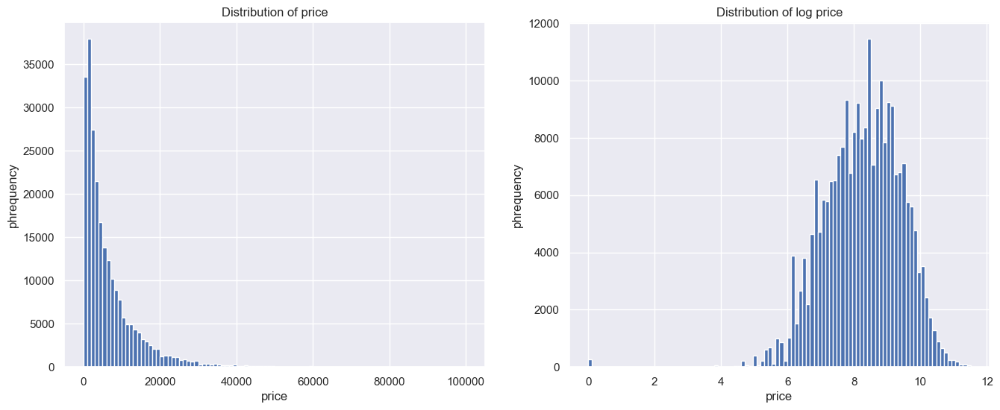

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
data['price'].hist(bins = 100, ax = axes[0])
axes[0].set_title('Distribution of price')
np.log(data['price']).hist(bins = 100, ax = axes[1])
axes[1].set_title('Distribution of log price')
axes[0].set_ylabel('phrequency')
axes[1].set_ylabel('phrequency')
axes[0].set_xlabel('price')
axes[1].set_xlabel('price')
plt.show()

Видно, что распределение похоже на логнормальное, поэтому с логарифмированной целевой переменной будет удобнее работать.
Например, видны выбросы с аномально маленьким логарифмированным таргетом, удалим их.

In [10]:
data['log_price'] = np.log(data['price'])
data = data[data['log_price']>4]

Построим графики зависимости целевой переменной от признаков

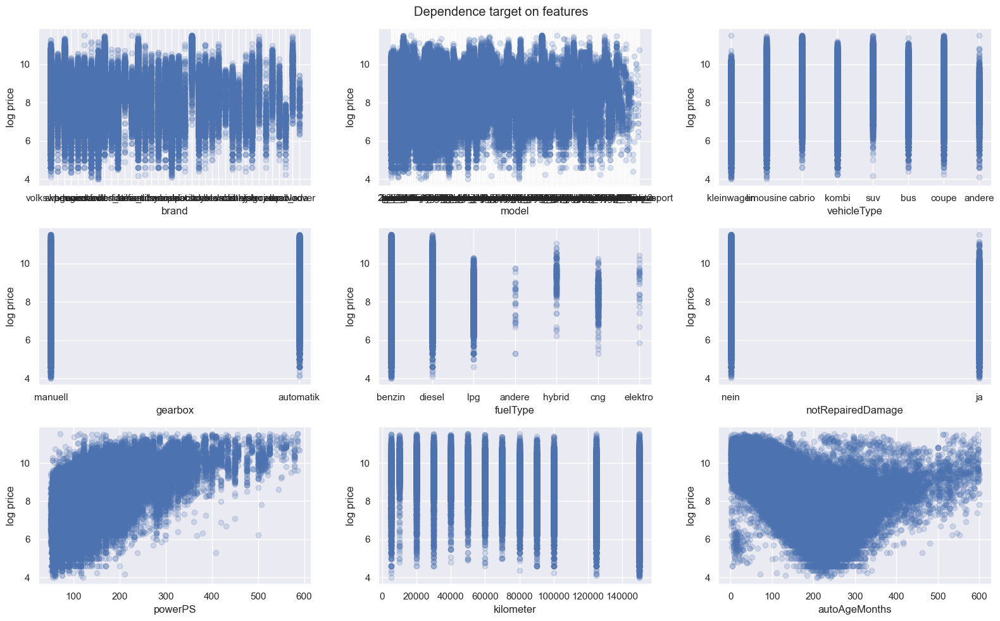

In [11]:
features = list(data.columns)
features.remove('price')
features.remove('log_price')

fig, axes = plt.subplots(figsize=(16, 10), ncols=3, nrows=3)
fig.suptitle('Dependence target on features')
for i, feature in enumerate(features):
    axes[i//3][i%3].scatter(data[feature], data['log_price'], alpha=0.2)
    axes[i//3][i%3].set_xlabel(feature)
    axes[i//3][i%3].set_ylabel("log price")
plt.tight_layout()

Построим гистограммы распределения признаков

In [12]:
import plotly.express as px

In [13]:
px.histogram(data, x = 'brand', title = 'Distribution of brand').update_xaxes(categoryorder = 'total descending')

In [14]:
px.histogram(data, x = 'model', title = 'Distribution of model').update_xaxes(categoryorder = 'total descending')

In [15]:
px.histogram(data, x = 'vehicleType', title = 'Distribution of vehicleType').update_xaxes(categoryorder = 'total descending')

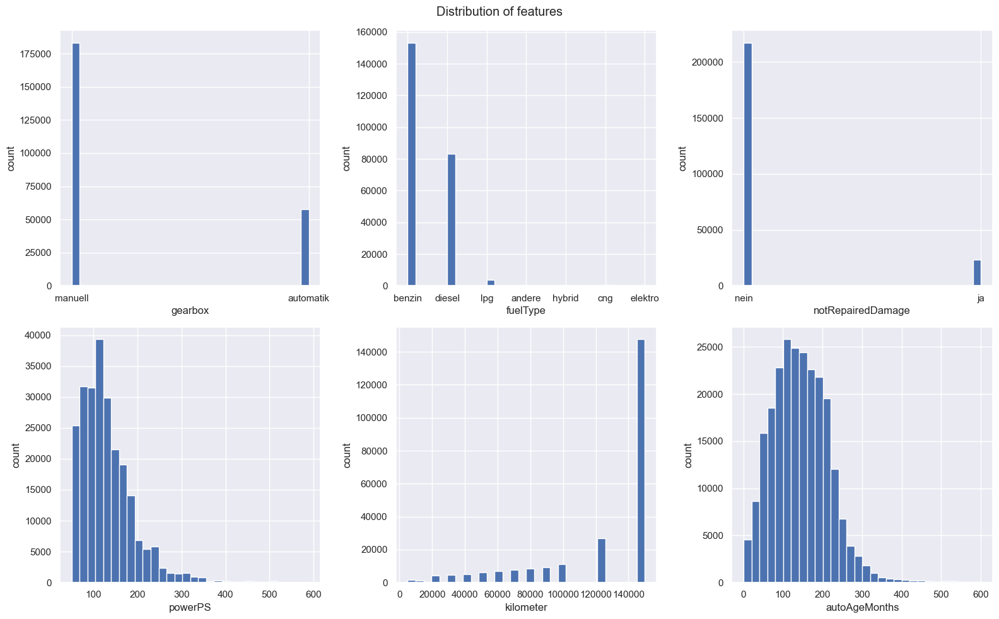

In [16]:
fig, axes = plt.subplots(figsize=(16, 10), ncols=3, nrows=2)
fig.suptitle('Distribution of features')
for i, feature in enumerate(features):
    if i//3 > 0:
        data[feature].hist(bins = 30, ax = axes[i//3 - 1][i%3])
        axes[i//3 - 1][i%3].set_xlabel(feature)
        axes[i//3 - 1][i%3].set_ylabel("count")
plt.tight_layout()

Проделав разведовательный анализ, получаем что для каждого из числовых признаков: 'powerPS', 'kilometer', 'autoAgeMonths', магнитуда значений разная, поэтому стоит их отномировать.

Признакам 'gearbox', 'fuelType', 'notRepairedDamage' стоит применить one-hot-encoding, так как их не сильно много и они имеют разное распределение.

Из графиков зависимости таргета от признаков, видно что таргет сильно коррелирует с 'powerPS' и 'autoAgeMonths'.

Признаки 'brand', 'model', 'vehicleType' тоже достаточно выжные, так как они сильно влияют на цену машины.

Колонки в данных:

* `brand` - название бренда автомобиля
* `model` - название модели автомобиля
* `vehicleType` - тип транспортного средства
* `gearbox` - тип трансмисcии
* `fuelType` - какой вид топлива использует автомобиль
* `notRepairedDamage` - есть ли в автомобиле неисправность, которая еще не устранена
* `powerPS` - мощность автомобиля в PS (метрическая лошадиная сила)
* `kilometer` - сколько километров проехал автомобиль, пробег
* `autoAgeMonths` - возраст автомобиля в месяцах


* `price` - цена, указанная в объявлении о продаже автомобиля (целевая переменная)

In [17]:
categorical = ['vehicleType', 'gearbox', 'fuelType', 'notRepairedDamage', 'brand', 'model']
numeric = ['powerPS', 'kilometer', 'autoAgeMonths']
other = []

In [18]:
data['bias'] = 1
other += ['bias']

x = data[categorical + numeric + other]
y = data['log_price']

In [19]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler


column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numeric),
    ('other',  'passthrough', other)
])

x = column_transformer.fit_transform(x)

In [20]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10)

X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=10)

y_train, y_test, y_val = y_train.values, y_test.values, y_val.values

## Задание 5. Сравнение методов градиентного спуска (2 балла)

В этом задании вам предстоит сравнить методы градиентного спуска на подготовленных вами данных из предыдущего задания.

### Задание 5.1. Подбор оптимальной длины шага (1 балл)

Подберите по валидационной выборке наилучшую длину шага $\lambda$ для каждого метода с точки зрения ошибки. Для этого сделайте перебор по логарифмической сетке. Для каждого метода посчитайте ошибку на обучающей и тестовой выборках, посчитайте качество по метрике $R^2$, сохраните количество итераций до сходимости.

Все параметры кроме `lambda_` стоит выставить равным значениям по умолчанию.

Так как выяснилось что, оптимальные значения lambda для разных методов отличаются, а при большом отклонении от оптимального происходят переполнения, будем для каждого метода запускать поиск отдельно.

In [176]:
full_lambdas = np.logspace(-4, 0.32, 100)
stochastic_lambdas = np.logspace(-1, -0.1, 100)
momentum_lambdas = np.logspace(-1, 0, 100)
adam_lambdas = np.logspace(-0.5, 1, 100)


lambdas = {'full':full_lambdas, 'stochastic':stochastic_lambdas, 'momentum':momentum_lambdas, 'adam':adam_lambdas}
best_loss = {'full':np.inf, 'stochastic':np.inf, 'momentum':np.inf, 'adam':np.inf}
best_lambda = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
iterations = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
losses = {'full':[], 'stochastic':[], 'momentum':[], 'adam':[]}

dimension = X_train.shape[1]

for method in tqdm(['full', 'stochastic', 'momentum', 'adam']):
    for lambda_ in tqdm(lambdas[method]):
        descent_config = {
            'descent_name': method,
            'kwargs': {
                'dimension': dimension,
                'lambda_': lambda_
            }
        }

        regression = LinearRegression(
        descent_config=descent_config
        )

        regression.fit(X_train, y_train)
        loss = regression.calc_loss(X_val, y_val)
        losses[method].append(loss)
        if loss < best_loss[method]:
            best_loss[method] = loss
            best_lambda[method] = lambda_

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [06:11<00:00, 92.96s/it] 


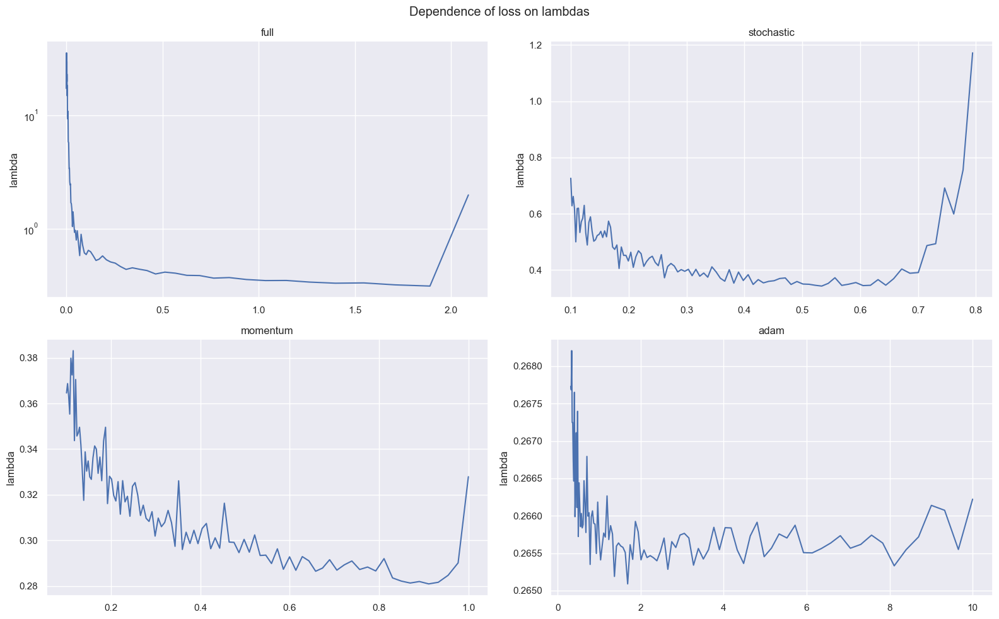

In [178]:
fig, axes = plt.subplots(figsize=(16, 10), ncols=2, nrows=2)
fig.suptitle('Dependence of loss on lambdas')

for ax, method in zip(axes.ravel(), ['full', 'stochastic', 'momentum', 'adam']):
    ax.set_title(method)
    ax.plot(lambdas[method], losses[method])
    ax.set_ylabel('loss')
    ax.set_ylabel('lambda')

axes[0][0].set_yscale('log')
plt.tight_layout()

In [179]:
stats = dict()
history = dict()

for method in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config = {
    'descent_name': method,
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda[method]
        }
    }

    regression = LinearRegression(
    descent_config=descent_config
    )

    regression.fit(X_train, y_train)

    train_loss = regression.calc_loss(X_train, y_train)
    test_loss = regression.calc_loss(X_test, y_test)

    y_train_pred = regression.predict(X_train)
    y_test_pred = regression.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    iterations = regression.descent.lr.iteration

    stats[method] = {'best_lambda':best_lambda[method], 'train_loss':train_loss, 'test_loss':test_loss, 'r2_train':r2_train, 'r2_test':r2_test, 'iterations':iterations}
    history[method] = regression.loss_history

In [180]:
for method in ['full', 'stochastic', 'momentum', 'adam']:
    print(method)
    for key in stats[method]:
        print(key, ':', stats[method][key])
    print('====================')

full
best_lambda : 1.8895728331809782
train_loss : 0.32843441177224614
test_loss : 0.332069202691132
r2_train : 0.7389952283324814
r2_test : 0.7389406929561689
iterations : 95
stochastic
best_lambda : 0.533669923120631
train_loss : 0.3511424364153151
test_loss : 0.3581291024247095
r2_train : 0.7209493032572045
r2_test : 0.7184534592381799
iterations : 290
momentum
best_lambda : 0.9111627561154894
train_loss : 0.2872964878793974
test_loss : 0.29272413521854274
r2_train : 0.771687279005827
r2_test : 0.7698721854485355
iterations : 126
adam
best_lambda : 1.6876124757881479
train_loss : 0.2690935884822778
test_loss : 0.2738790118973058
r2_train : 0.7861530092415693
r2_test : 0.7846874552643686
iterations : 165


### Задание 5.2. Сравнение методов (1 балла) 

Постройте график зависимости ошибки на обучающей выборке от номера итерации (все методы на одном графике).

Посмотрите на получившиеся результаты (таблички с метриками и график). Сравните методы между собой.

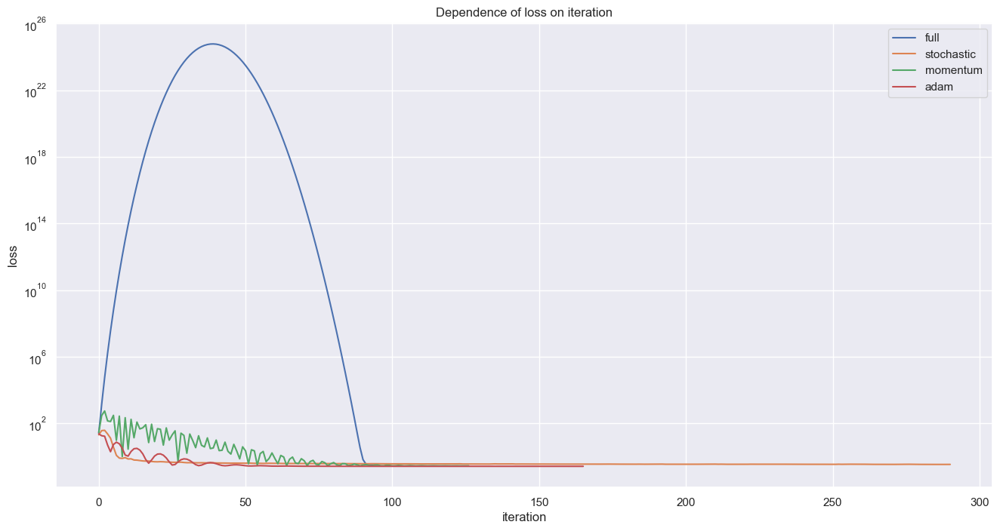

In [187]:
plt.figure(figsize=(16, 8))
for method in ['full', 'stochastic', 'momentum', 'adam']:
    plt.semilogy(history[method], label = method)
plt.title('Dependence of loss on iteration')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.legend()
plt.show()

Из графика видим что:
- stochastic градиентный спуск дольше всех сходится, но очень быстро выходит на плато 
- momentum и full градиентный спуск долго выходят на плато, но быстрее других сходятся
- adam тоже достаточно быстро выходит на плато, но медленнее stochastic, и быстро сходится

Из табличек видим что:
- относительно неплохие разультаты показывают momentum и adam, смотря по ошибке
- у adam и full сравнительно большой lambda
- stochastic несмотря на большое число итераций, не достигает хорошего качества


## Задание 6. Стохастический градиентный спуск и размер батча (1 балл)

В этом задании вам предстоит исследовать влияние размера батча на работу стохастического градиентного спуска. 

* Сделайте по несколько запусков (например, k = 10) стохастического градиентного спуска на обучающей выборке для каждого размера батча из перебираемого списка. Замерьте время в секундах и количество итераций до сходимости. Посчитайте среднее этих значений для каждого размера батча.
* Постройте график зависимости количества шагов до сходимости от размера батча.
* Постройте график зависимости времени до сходимости от размера батча.

Посмотрите на получившиеся результаты. Какие выводы можно сделать про подбор размера батча для стохастического градиентного спуска?

In [158]:
batch_sizes = np.arange(5, 500, 10)
best_lambda = stats['stochastic']['best_lambda']
k = 10

num_iterations = []
times = []

for batch_size in tqdm(batch_sizes):
    sum_iterations = 0
    sum_times = 0

    descent_config = {
    'descent_name': 'stochastic',
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda,
        'batch_size': batch_size
        }
    }

    for i in range(k):
        regression = LinearRegression(
        descent_config=descent_config
        )
        start = time.time()
        regression.fit(X_train, y_train)
        end = time.time()

        sum_times += end - start
        sum_iterations += regression.descent.lr.iteration
    
    num_iterations.append(sum_iterations/k)
    times.append(sum_times/k)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [05:05<00:00,  6.10s/it]


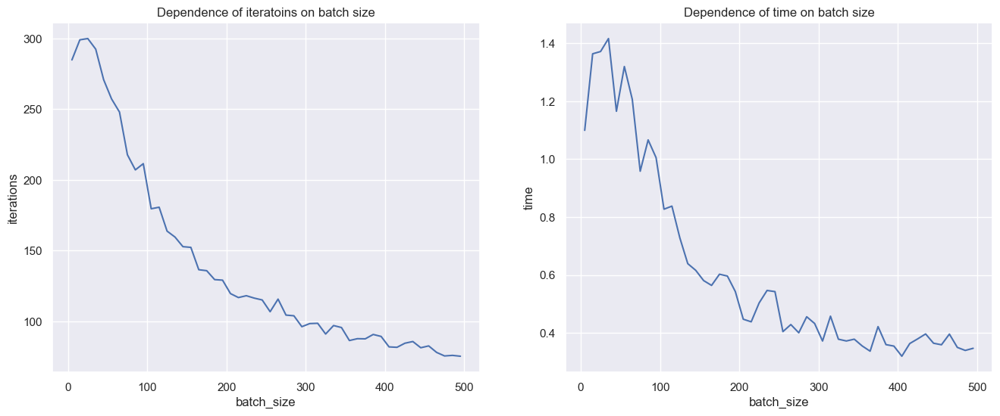

In [159]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].plot(batch_sizes, num_iterations)
axes[0].set_xlabel('batch_size')
axes[0].set_ylabel('iterations')
axes[0].set_title('Dependence of iteratoins on batch size')
axes[1].plot(batch_sizes, times)
axes[1].set_xlabel('batch_size')
axes[1].set_ylabel('time')
axes[1].set_title('Dependence of time on batch size')
plt.show()

Смотря на графики, делаем вывод, что число итераций и время для сходимости уменьшается с увеличением batch_size, при этом убывание нелинейное. Поэтому если возникают трудности использовать максимальный batch_size, можно выбрать значение, после которого число итераций и время не сильно уже уменьшаются, например batch_size = 300

## Задание 7. Регуляризация (1 балл)

В этом задании вам предстоит исследовать влияние регуляризации на работу различных методов градиентного спуска. Напомним, регуляризация - это добавка к функции потерь, которая штрафует за норму весов. Мы будем использовать l2 регуляризацию, таким образом функция потерь приобретает следующий вид:

$$
    Q(w) = \dfrac{1}{\ell} \sum\limits_{i=1}^{\ell} (a_w(x_i) - y_i)^2 + \dfrac{\mu}{2} \| w \|^2
$$

Допишите класс **BaseDescentReg** в файле `descents.py`.

Протестируйте ваше решение в контесте.

Вставьте ссылку на успешную посылку:

* **BaseDescentReg**: https://contest.yandex.ru/contest/54610/run-report/95944841/

Найдите лучшие параметры обучения с регуляризацией аналогично 5 заданию. Будем подбирать длину шага $\lambda$ (`lambda_`) и коэффициент регуляризации $\mu$ (`mu`).

Сравните для каждого метода результаты с регуляризацией и без регуляризации (нужно опять сохранить ошибку и качество по метрике $R^2$ на обучающей и тестовой выборках и количество итераций до сходимости).

Постройте для каждого метода график со значениями функции потерь MSE с регуляризацией и без регуляризации (всего должно получиться 4 графика).

Посмотрите на получившиеся результаты. Какие можно сделать выводы, как регуляризация влияет на сходимость? Как изменилось качество на обучающей выборке? На тестовой? Чем вы можете объяснить это?

In [21]:
full_lambdas = np.logspace(-4, 0.32, 20)
stochastic_lambdas = np.logspace(-1, -0.1, 20)
momentum_lambdas = np.logspace(-1, 0, 10)
adam_lambdas = np.logspace(-0.5, 0.5, 10)

full_mus = np.logspace(-9, 0, 10)
stochastic_mus = np.logspace(-9, 0, 10)
momentum_mus = np.logspace(-9, 0, 10)
adam_mus = np.logspace(-9, 0, 10)


lambdas = {'full':full_lambdas, 'stochastic':stochastic_lambdas, 'momentum':momentum_lambdas, 'adam':adam_lambdas}
mus = {'full':full_mus, 'stochastic':stochastic_mus, 'momentum':momentum_mus, 'adam':adam_mus}
best_loss = {'full':np.inf, 'stochastic':np.inf, 'momentum':np.inf, 'adam':np.inf}
best_lambda = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
best_mu = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
iterations = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
losses = {'full':[], 'stochastic':[], 'momentum':[], 'adam':[]}

dimension = X_train.shape[1]

for method in tqdm(['full', 'stochastic', 'momentum', 'adam']):
    for lambda_ in tqdm(lambdas[method]):
        for mu_ in mus[method]:
            descent_config = {
                'descent_name': method,
                'regularized': True,
                'kwargs': {
                    'dimension': dimension,
                    'lambda_': lambda_,
                    'mu': mu_
                }
            }

            regression = LinearRegression(
            descent_config=descent_config
            )

            regression.fit(X_train, y_train)
            loss = regression.calc_loss(X_val, y_val)
            losses[method].append(loss)
            if loss < best_loss[method]:
                best_loss[method] = loss
                best_lambda[method] = lambda_
                best_mu[method] = mu_

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [10:29<00:00, 157.42s/it]


In [22]:
stats_reg = dict()
history_reg = dict()

for method in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config = {
    'descent_name': method,
    'regularized': True,
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda[method],
        'mu': best_mu[method]
        }
    }

    regression = LinearRegression(
    descent_config=descent_config
    )

    regression.fit(X_train, y_train)

    train_loss = regression.calc_loss(X_train, y_train)
    test_loss = regression.calc_loss(X_test, y_test)

    y_train_pred = regression.predict(X_train)
    y_test_pred = regression.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    iterations = regression.descent.lr.iteration

    stats_reg[method] = {'best_lambda':best_lambda[method], 'best_mu':best_mu[method], 'train_loss':train_loss, 'test_loss':test_loss, 'r2_train':r2_train, 'r2_test':r2_test, 'iterations':iterations}
    history_reg[method] = regression.loss_history

In [23]:
for method in ['full', 'stochastic', 'momentum', 'adam']:
    print(method)
    for key in stats_reg[method]:
        print(key, ':', stats_reg[method][key])
    print('====================')

full
best_lambda : 2.0892961308540396
best_mu : 0.01
train_loss : 0.30963630808503395
test_loss : 0.31483727724244454
r2_train : 0.7539339636927258
r2_test : 0.7524877321883785
iterations : 251
stochastic
best_lambda : 0.6386503549649857
best_mu : 0.01
train_loss : 0.3543489939894676
test_loss : 0.35968970319074584
r2_train : 0.7184010720199101
r2_test : 0.7172265783613874
iterations : 300
momentum
best_lambda : 1.0
best_mu : 0.001
train_loss : 0.2842308528609938
test_loss : 0.2895664731455315
r2_train : 0.7741235199699719
r2_test : 0.7723546109971211
iterations : 149
adam
best_lambda : 1.4677992676220695
best_mu : 1e-09
train_loss : 0.26915709804408317
test_loss : 0.27382749872761397
r2_train : 0.7861025385902504
r2_test : 0.7847279528241374
iterations : 162


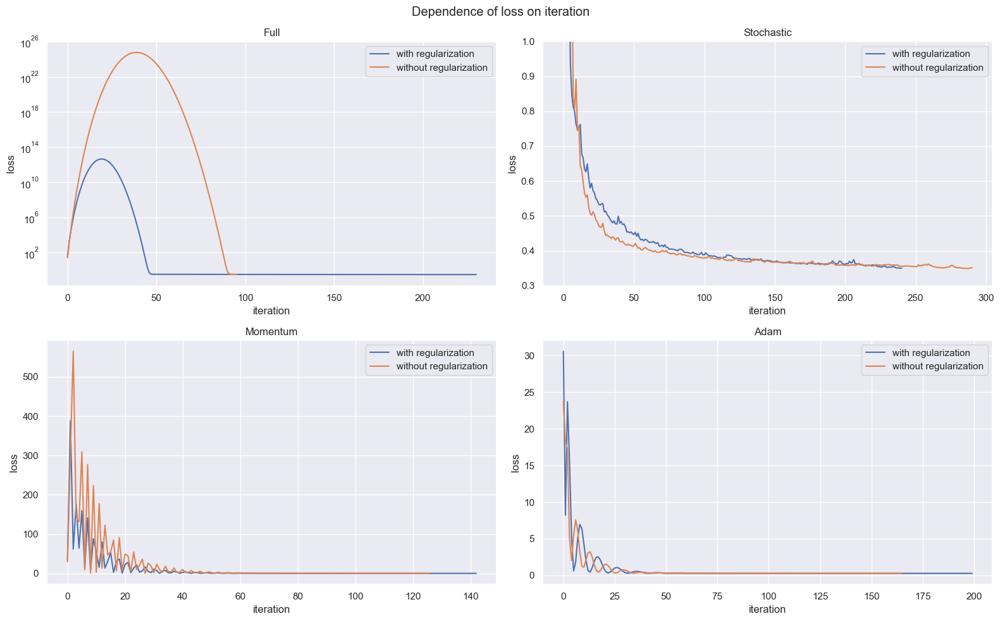

In [196]:
fig, axes = plt.subplots(figsize=(16, 10), ncols=2, nrows=2)
fig.suptitle('Dependence of loss on iteration')
axes[0][0].set_title('Full')
axes[0][1].set_title('Stochastic')
axes[1][0].set_title('Momentum')
axes[1][1].set_title('Adam')
axes[0][0].set_yscale('log')

for ax, method in zip(axes.ravel(), ['full', 'stochastic', 'momentum', 'adam']):
    ax.plot(history_reg[method], label = 'with regularization')
    ax.plot(history[method], label = 'without regularization')
    ax.set_ylabel('loss')
    ax.set_xlabel('iteration')
    ax.legend()

axes[0][1].set_ylim([0.3, 1])
plt.tight_layout()

Из графиков full и momentum видно, что регуляризация хорошо влияет на сходимость, при гораздо меньшем числе итераций график выходит на плато, однако число итераций для терминации градиентного спуска все так же велико. Для stochastic и adam число разница уже не так ощутима, но для каких-то итераций качество стало лучше.

Судя по таблицам статистик, регуляризация качество при регуляризации почти не изменилось, однако немного улучшились R_2 статистики моделей.

## Задание 8. Альтернативная функция потерь (1 балл)

В этом задании вам предстоит использовать другую функцию потерь для нашей задачи регрессии. В качестве функции потерь мы выбрали **Log-Cosh**:

$$
    L(y, a)
    =
    \log\left(\cosh(a - y)\right).
$$

Самостоятельно продифференцируйте данную функцию потерь чтобы найти её градиент:

$[DL_w(y_i, X_iw)](h) = 
[Dlog(cosh(X_iw - y_i))](h) = \\
= [D_{cosh(x)}]([D_{X_iw - y_i} cosh(x)](D[X_iw - y](h)) = \\
= \frac{1}{cosh(X_iw - y_i)} \cdot sinh(X_iw - y_i) \cdot X_ih = \\
= tanh(X_iw - y_i)X_ih \rightarrow \\
\nabla L_w(X_i, y_i) = tanh(X_iw - y_i)X_i^T$

Тогда $\nabla Q_w(X, y) = \frac{1}{l} \sum tanh(X_iw - y_i)X_i^T = \frac{1}{l} X^T tanh(Xw - y)$

Программно реализуйте градиентный спуск с данной функцией потерь в файле `descents.py`, обучите все четыре метода (без регуляризации) аналогично 5 заданию, сравните их качество с четырьмя методами из 5 задания.

Пример того, как можно запрограммировать использование нескольких функций потерь внутри одного класса градиентного спуска:


```python
from enum import auto
from enum import Enum

import numpy as np

class LossFunction(Enum):
    MSE = auto()
    MAE = auto()
    LogCosh = auto()
    Huber = auto()

...
class BaseDescent:
    def __init__(self, loss_function: LossFunction = LossFunction.MSE):
        self.loss_function: LossFunction = loss_function

    def calc_gradient(self, x: np.ndarray, y: np.ndarray) -> np.ndarray:
        if self.loss_function is LossFunction.MSE:
            return ...
        elif self.loss_function is LossFunction.LogCosh:
            return ...
...

```

In [197]:
full_lambdas = np.logspace(-4, 1.5, 20)
stochastic_lambdas = np.logspace(-1, 1.3, 20)
momentum_lambdas = np.logspace(-1, 1, 20)
adam_lambdas = np.logspace(-0.5, 1, 20)


lambdas = {'full':full_lambdas, 'stochastic':stochastic_lambdas, 'momentum':momentum_lambdas, 'adam':adam_lambdas}
best_loss = {'full':np.inf, 'stochastic':np.inf, 'momentum':np.inf, 'adam':np.inf}
best_lambda = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
iterations = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
losses = {'full':[], 'stochastic':[], 'momentum':[], 'adam':[]}

dimension = X_train.shape[1]

for method in tqdm(['full', 'stochastic', 'momentum', 'adam']):
    for lambda_ in tqdm(lambdas[method]):
        descent_config = {
            'descent_name': method,
            'kwargs': {
                'dimension': dimension,
                'lambda_': lambda_,
                'loss_function': LossFunction.LogCosh
            }
        }

        regression = LinearRegression(
        descent_config=descent_config
        )

        regression.fit(X_train, y_train)
        loss = regression.calc_loss(X_val, y_val)
        losses[method].append(loss)
        if loss < best_loss[method]:
            best_loss[method] = loss
            best_lambda[method] = lambda_

100%|██████████| 4/4 [02:06<00:00, 31.57s/it]


In [198]:
stats_logcosh = dict()
history_logcosh = dict()

for method in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config = {
    'descent_name': method,
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda[method],
        'loss_function': LossFunction.LogCosh
        }
    }

    regression = LinearRegression(
    descent_config=descent_config
    )

    regression.fit(X_train, y_train)

    train_loss = regression.calc_loss(X_train, y_train)
    test_loss = regression.calc_loss(X_test, y_test)

    y_train_pred = regression.predict(X_train)
    y_test_pred = regression.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    iterations = regression.descent.lr.iteration

    stats_logcosh[method] = {'best_lambda':best_lambda[method], 'train_loss':train_loss, 'test_loss':test_loss, 'r2_train':r2_train, 'r2_test':r2_test, 'iterations':iterations}
    history_logcosh[method] = regression.loss_history

In [199]:
for method in ['full', 'stochastic', 'momentum', 'adam']:
    print(method)
    for key in stats_logcosh[method]:
        print(key, ':', stats_logcosh[method][key])
    print('====================')

full
best_lambda : 8.3378222347179
train_loss : 0.12488136695891844
test_loss : 0.126380044861236
r2_train : 0.7358542162701618
r2_test : 0.7349406589849389
iterations : 172
stochastic
best_lambda : 3.7470044642998688
train_loss : 0.12503285824869387
test_loss : 0.12622060732988544
r2_train : 0.7317958805010569
r2_test : 0.732036405404108
iterations : 300
momentum
best_lambda : 7.847599703514611
train_loss : 0.1080305984121149
test_loss : 0.10964978879778908
r2_train : 0.7709041127040454
r2_test : 0.7692147276761019
iterations : 225
adam
best_lambda : 10.0
train_loss : 0.10477218665525934
test_loss : 0.10640560180279793
r2_train : 0.7791020836947067
r2_test : 0.7774571461004556
iterations : 255


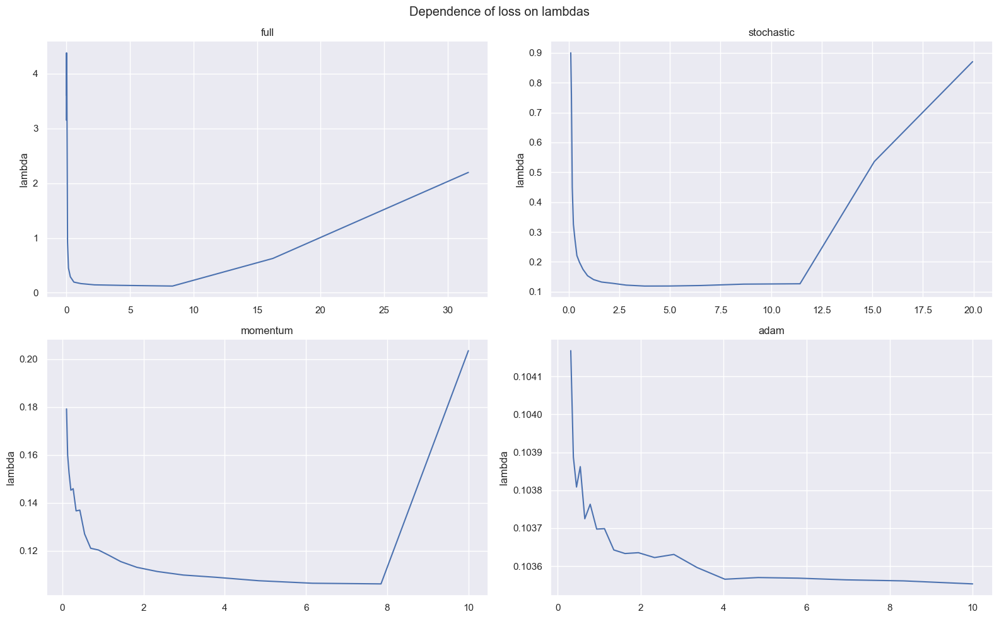

In [201]:
fig, axes = plt.subplots(figsize=(16, 10), ncols=2, nrows=2)
fig.suptitle('Dependence of loss on lambdas')

for ax, method in zip(axes.ravel(), ['full', 'stochastic', 'momentum', 'adam']):
    ax.set_title(method)
    ax.plot(lambdas[method], losses[method])
    ax.set_ylabel('loss')
    ax.set_ylabel('lambda')
    
plt.tight_layout()

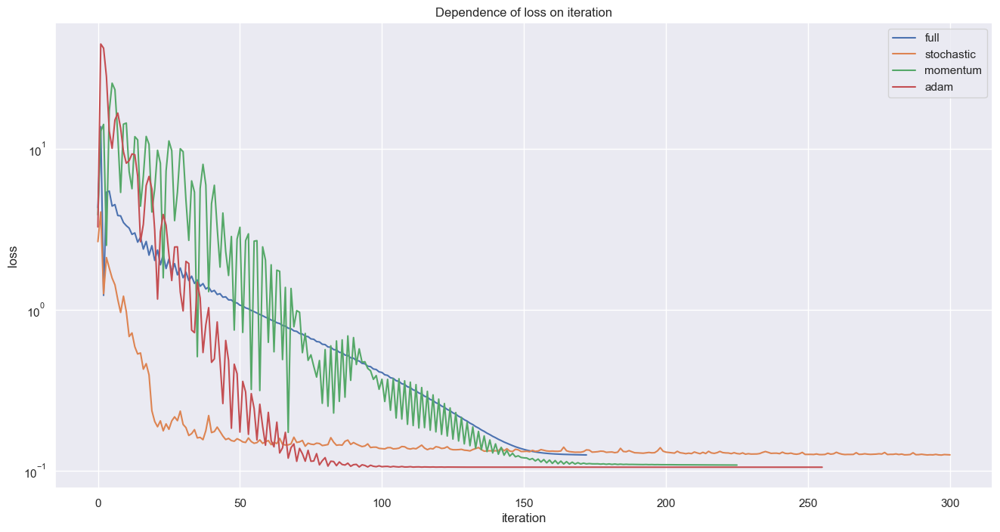

In [202]:
plt.figure(figsize=(16, 8))
for method in ['full', 'stochastic', 'momentum', 'adam']:
    plt.semilogy(history_logcosh[method], label = method)
plt.title('Dependence of loss on iteration')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.legend()
plt.show()

Сравнивать качество моделей с разными функциями потерь по функциям потерь не корректно, поэтому сравним по R_2:

- для stochastic качество немного улучшилось, а для adam - немного ухудшилось
- full стал сходиться монотонно
- adam и momentum стали менее учлойчивы (увеличилось число колебаний)
- в остальном методы ведут себя похожим образом

### Кулинарно-социализационный бонус. (0.5 балла).

Как мы знаем, осень прекрасная пора, время пробовать новое и делиться теплом с друзьями и близкими. Выберите рецепт, который соответствует вашему настроению, приготовьте выбранное блюдо и угостите хотя бы одного человека им. Кратко опишите ваши впечатления, прикрепите рецепт и фотографии блюда и довольного гостя.

`### ваш кулинарный опыт тут ###`

### Бонус 1. Другие методы градиентного спуска (1 балл).

По желанию выберите метод градиентного спуска из следующего списка и самостоятельно реализуйте его в файле `descents.py`. Обучите линейную регрессию с помощью этого метода, сравните с методами из основной части домашнего задания.

`AdaMax` (вариация Adam основанная на $l_{\infty}$), `Nadam` (вариация Adam совмещенная с методом импульса Нестерова), `AMSGrad` (ещё одна вариация Adam).

In [26]:
#AMSGrad
lambdas = np.logspace(-1, 0.2, 100)
dimension = X_train.shape[1]
best_loss = np.inf
best_lambda = None
iterations = None
losses = []
for lambda_ in lambdas:
    descent_config = {
        'descent_name': 'amsgrad',
        'kwargs': {
            'dimension': dimension,
            'lambda_': lambda_
        }
    }

    regression = LinearRegression(
    descent_config=descent_config
    )

    regression.fit(X_train, y_train)
    loss = regression.calc_loss(X_val, y_val)
    losses.append(loss)
    if loss < best_loss:
        best_loss = loss
        best_lambda = lambda_

descent_config = {
    'descent_name': 'amsgrad',
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda
    }
}

regression = LinearRegression(
descent_config=descent_config
)

regression.fit(X_train, y_train)

train_loss = regression.calc_loss(X_train, y_train)
test_loss = regression.calc_loss(X_test, y_test)

y_train_pred = regression.predict(X_train)
y_test_pred = regression.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

iterations = regression.descent.lr.iteration

amsgrad_stats = {'best_lambda':best_lambda, 'train_loss':train_loss, 'test_loss':test_loss, 'r2_train':r2_train, 'r2_test':r2_test, 'iterations':iterations}
amsgrad_history = regression.loss_history

Text(0, 0.5, 'lambda')

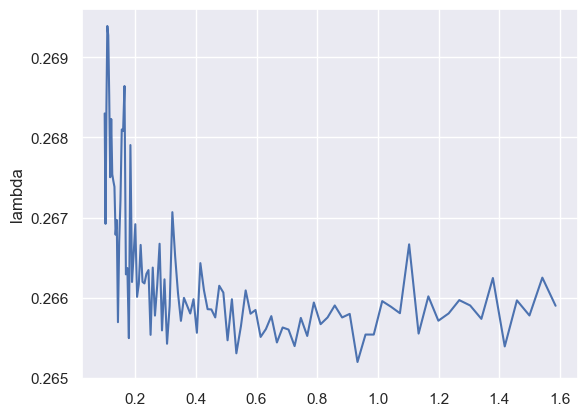

In [27]:
fig.suptitle('Dependence of loss on lambdas')
plt.plot(lambdas, losses)
plt.ylabel('loss')
plt.ylabel('lambda')

In [28]:
print('amsgrad')
for key in amsgrad_stats.keys():
    print(key, ':', amsgrad_stats[key])

amsgrad
best_lambda : 0.9326033468832199
train_loss : 0.26918410216698957
test_loss : 0.27397785468438035
r2_train : 0.7860810785827705
r2_test : 0.784609749083576
iterations : 127


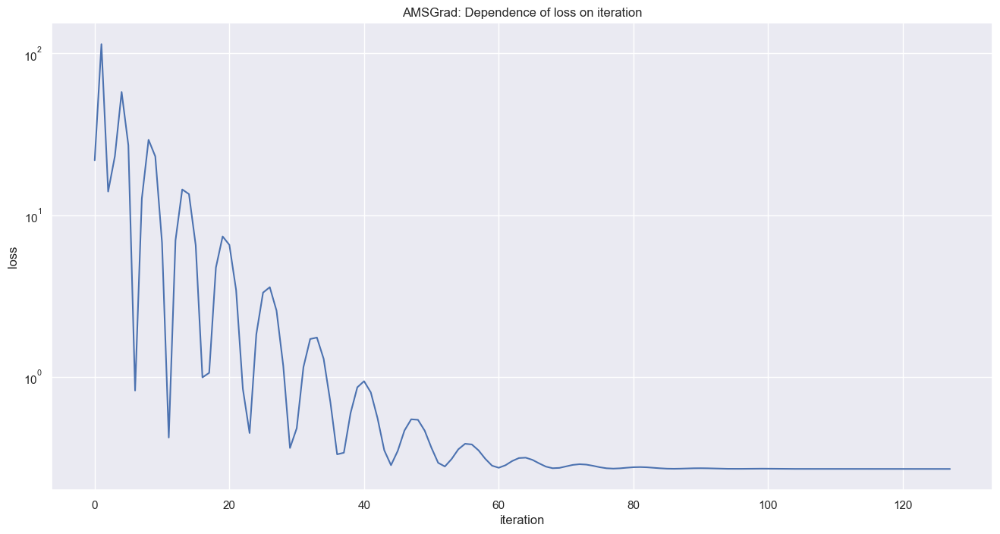

In [32]:
plt.figure(figsize=(16, 8))
plt.semilogy(amsgrad_history)
plt.title('AMSGrad: Dependence of loss on iteration')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.show()

Из графика получаем, что метод AMSGrad тоже довольно быстро выходит на плато и сходится за порядка 100 итераций, оченб похож на adam в этом.
Так же из данных таблицы видим, что метод не уступает adam - наилучшему из рассмотренных ранее.

### Бонус 2. Другие функции потерь (1 балл).

Аналогично 8 заданию реализуйте две функции потерь - **MAE** и **Huber**.

Самостоятельно продифференцируйте данные функции потерь, чтобы найти их градиенты:

### MAE

$[DL_w(y_i, X_iw)](h) = 
= [D|X_iw - y_i|](h) = \\
= [D(X_iw - y_i)I_{[X_iw - y_i>0]} - (X_iw - y_i)I_{[X_iw - y_i<0]}](h) = \\
= [D(X_iw - y_i)I_{[X_iw - y_i>0]}](h) - [D[(X_iw - y_i)I_{[X_iw - y_i<0]}](h) = \\
= I_{[X_iw - y_i>0]}[D(X_iw - y_i)](h) - I_{[X_iw - y_i<0]}[D[(X_iw - y_i)](h) = \\
= (I_{[X_iw - y_i>0]} - I_{[X_iw - y_i<0]})[D(X_iw - y_i)](h) = \\
= (2I_{[X_iw - y_i>0]} - 1)[D(X_iw - y_i)](h) = \\
= (2I_{[X_iw - y_i>0]} - 1)X_ih \rightarrow \\
\nabla L_w(X_i, y_i) = (2I_{[X_iw - y_i>0]} - 1)X_i^T$

Тогда $\nabla Q_w(X, y) = \frac{1}{l} \sum (2I_{[X_iw - y_i>0]} - 1)X_i^T = \frac{1}{l} X^T (2I_{[Xw - y>0]} - 1)$

### Huber

$[DL_w(y_i, X_iw)](h) = \\
= [D\frac{1}{2}(X_iw - y_i)^2I_{(X_iw - y_i)^2 \leq \delta^2} + \delta(|X_iw - y_i| - \frac{1}{2}\delta)I_{(X_iw - y)^2 > \delta^2}](h) = \\
= [D\frac{1}{2}(X_iw - y_i)^2I_{(X_iw - y_i)^2 \leq \delta^2}](h) + [D\delta(|X_iw - y_i| - \frac{1}{2}\delta)I_{(X_iw - y_i)^2 > \delta^2}](h) = \\
= \frac{1}{2} I_{(X_iw - y_i)^2 \leq \delta^2}[D(X_iw - y_i)^2](h) + \delta I_{(X_iw - y_i)^2 > \delta^2}[D(|X_iw - y_i| - \frac{1}{2}\delta)](h) = \\
= \frac{1}{2} I_{(X_iw - y_i)^2 \leq \delta^2} \cdot 2(X_iw - y_i)X_ih + \delta I_{(X_iw - y_i)^2 > \delta^2} \cdot (2I_{X_iw - y_i>0} - 1)X_ih = \\
= (I_{(X_iw - y_i)^2 \leq \delta^2} \cdot (X_iw - y_i) + \delta I_{(X_iw - y_i)^2 > \delta^2} \cdot (2I_{X_iw - y_i>0} - 1))X_ih \rightarrow \\
\nabla L_w(X_i, y_i) = (I_{(X_iw - y_i)^2 \leq \delta^2} \cdot (X_iw - y_i) + \delta I_{(X_iw - y_i)^2 > \delta^2} \cdot (2I_{X_iw - y_i>0} - 1))X_i^T$

Тогда $\nabla Q_w(X, y) = \frac{1}{l} \sum (I_{(X_iw - y)^2 \leq \delta^2} \cdot (X_iw - y_i) + \delta I_{(X_iw - y)^2 > \delta^2} \cdot (2I_{X_iw - y_i>0} - 1))X_i^T = \\
= \frac{1}{l} X^T (I_{(Xw - y)^2 \leq \delta^2} * (Xw - y) + \delta I_{(Xw - y)^2 > \delta^2} * (2I_{Xw - y>0} - 1))$

Программно реализуйте градиентный спуск с данными функциями потерь в файле `descents.py`, обучите все четыре метода (без регуляризации) аналогично 5 заданию, сравните их качество с четырьмя методами из 5 задания.

Сравните между собой *для каждого метода отдельно* качество для разных функций потерь. Какая оказалась лучше? Как вы думаете почему?

# MAE

In [256]:
full_lambdas = np.logspace(-4, 0.5, 100)
stochastic_lambdas = np.logspace(-1, 0.5, 100)
momentum_lambdas = np.logspace(-1, 0.5, 100)
adam_lambdas = np.logspace(-0.5, 1, 100)


lambdas = {'full':full_lambdas, 'stochastic':stochastic_lambdas, 'momentum':momentum_lambdas, 'adam':adam_lambdas}
best_loss = {'full':np.inf, 'stochastic':np.inf, 'momentum':np.inf, 'adam':np.inf}
best_lambda = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
iterations = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
losses = {'full':[], 'stochastic':[], 'momentum':[], 'adam':[]}

dimension = X_train.shape[1]

for method in tqdm(['full', 'stochastic', 'momentum', 'adam']):
    for lambda_ in tqdm(lambdas[method]):
        descent_config = {
            'descent_name': method,
            'kwargs': {
                'dimension': dimension,
                'lambda_': lambda_,
                'loss_function': LossFunction.MAE
            }
        }

        regression = LinearRegression(
        descent_config=descent_config
        )

        regression.fit(X_train, y_train)
        loss = regression.calc_loss(X_val, y_val)
        losses[method].append(loss)
        if loss < best_loss[method]:
            best_loss[method] = loss
            best_lambda[method] = lambda_

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [09:13<00:00, 138.35s/it]


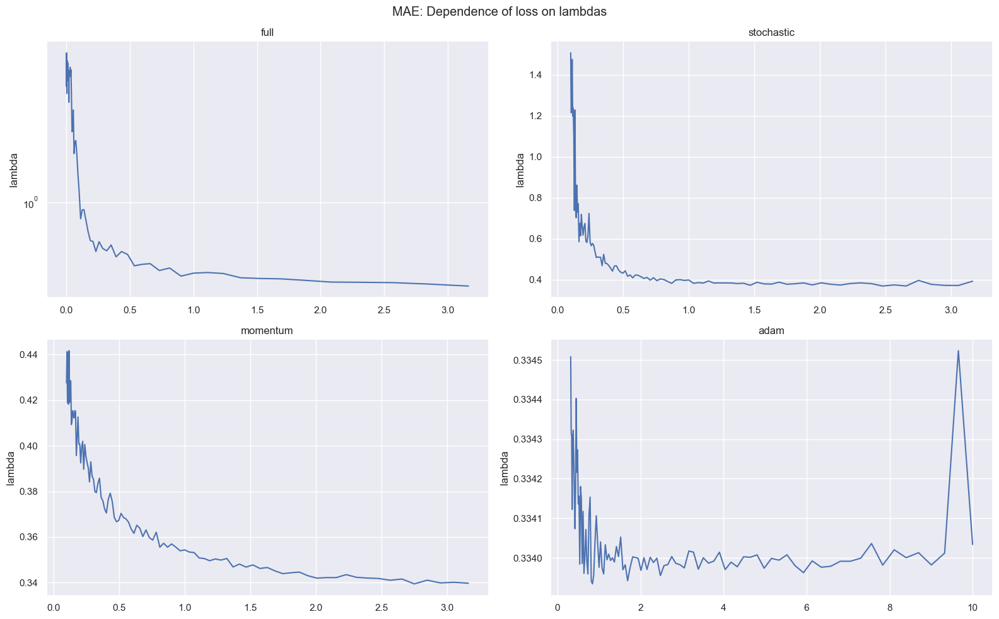

In [257]:
fig, axes = plt.subplots(figsize=(16, 10), ncols=2, nrows=2)
fig.suptitle('MAE: Dependence of loss on lambdas')

for ax, method in zip(axes.ravel(), ['full', 'stochastic', 'momentum', 'adam']):
    ax.set_title(method)
    ax.plot(lambdas[method], losses[method])
    ax.set_ylabel('loss')
    ax.set_ylabel('lambda')

axes[0][0].set_yscale('log')
plt.tight_layout()

In [ ]:
stats_mae = dict()
history_mae = dict()

for method in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config = {
    'descent_name': method,
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda[method],
        'loss_function': LossFunction.MAE
        }
    }

    regression = LinearRegression(
    descent_config=descent_config
    )

    regression.fit(X_train, y_train)

    train_loss = regression.calc_loss(X_train, y_train)
    test_loss = regression.calc_loss(X_test, y_test)

    y_train_pred = regression.predict(X_train)
    y_test_pred = regression.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    iterations = regression.descent.lr.iteration

    stats_mae[method] = {'best_lambda':best_lambda[method], 'train_loss':train_loss, 'test_loss':test_loss, 'r2_train':r2_train, 'r2_test':r2_test, 'iterations':iterations}
    history_mae[method] = regression.loss_history

In [261]:
for method in ['full', 'stochastic', 'momentum', 'adam']:
    print(method)
    for key in stats_mae[method]:
        print(key, ':', stats_mae[method][key])
    print('====================')

full
best_lambda : 3.1622776601683795
train_loss : 0.3793953455254709
test_loss : 0.3838642689025884
r2_train : 0.7124210214215007
r2_test : 0.7109137524158242
iterations : 178
stochastic
best_lambda : 2.4770763559917115
train_loss : 0.377600042829868
test_loss : 0.38182273000282746
r2_train : 0.7222950774509369
r2_test : 0.7199219746979015
iterations : 300
momentum
best_lambda : 2.7503878409319458
train_loss : 0.3429999637341611
test_loss : 0.34658621915722604
r2_train : 0.7437214130466876
r2_test : 0.7419633614442789
iterations : 165
adam
best_lambda : 0.8399287059458466
train_loss : 0.3354160662795974
test_loss : 0.3392929941162286
r2_train : 0.7558333996359321
r2_test : 0.7541752558394819
iterations : 234


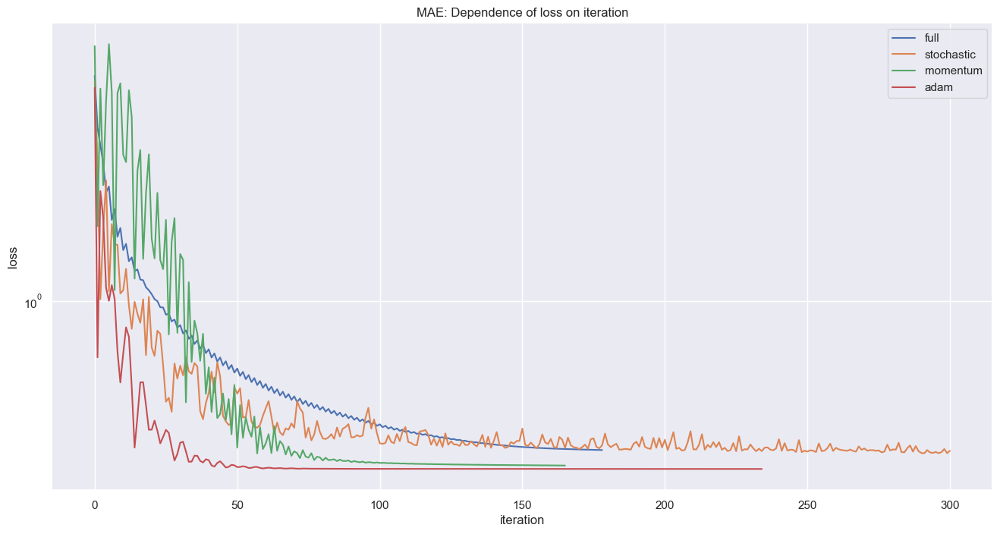

In [262]:
plt.figure(figsize=(16, 8))
for method in ['full', 'stochastic', 'momentum', 'adam']:
    plt.semilogy(history_mae[method], label = method)
plt.title('MAE: Dependence of loss on iteration')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.legend()
plt.show()

# HUBER

In [30]:
full_lambdas = np.logspace(-4, 0.5, 100)
stochastic_lambdas = np.logspace(-1, 0.5, 100)
momentum_lambdas = np.logspace(-1, 0.5, 100)
adam_lambdas = np.logspace(-0.5, 1, 100)


lambdas = {'full':full_lambdas, 'stochastic':stochastic_lambdas, 'momentum':momentum_lambdas, 'adam':adam_lambdas}
best_loss = {'full':np.inf, 'stochastic':np.inf, 'momentum':np.inf, 'adam':np.inf}
best_lambda = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
iterations = {'full':None, 'stochastic':None, 'momentum':None, 'adam':None}
losses = {'full':[], 'stochastic':[], 'momentum':[], 'adam':[]}

dimension = X_train.shape[1]

for method in tqdm(['full', 'stochastic', 'momentum', 'adam']):
    for lambda_ in tqdm(lambdas[method]):
        descent_config = {
            'descent_name': method,
            'kwargs': {
                'dimension': dimension,
                'lambda_': lambda_,
                'loss_function': LossFunction.Huber
            }
        }

        regression = LinearRegression(
        descent_config=descent_config
        )

        regression.fit(X_train, y_train)
        loss = regression.calc_loss(X_val, y_val)
        losses[method].append(loss)
        if loss < best_loss[method]:
            best_loss[method] = loss
            best_lambda[method] = lambda_

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [08:08<00:00, 122.18s/it]


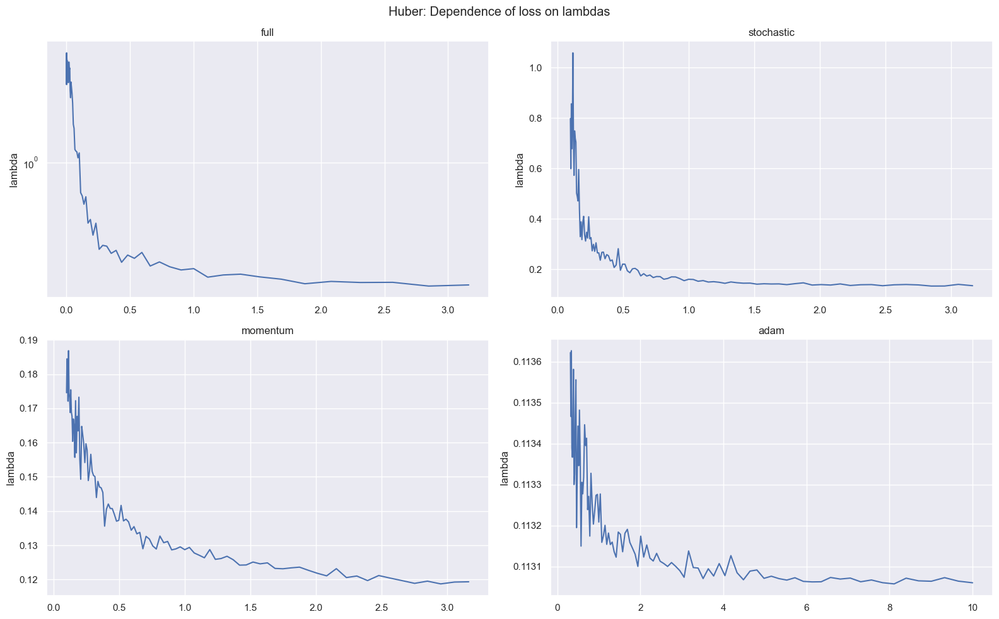

In [31]:
fig, axes = plt.subplots(figsize=(16, 10), ncols=2, nrows=2)
fig.suptitle('Huber: Dependence of loss on lambdas')

for ax, method in zip(axes.ravel(), ['full', 'stochastic', 'momentum', 'adam']):
    ax.set_title(method)
    ax.plot(lambdas[method], losses[method])
    ax.set_ylabel('loss')
    ax.set_ylabel('lambda')

axes[0][0].set_yscale('log')
plt.tight_layout()

In [32]:
stats_huber = dict()
history_huber = dict()

for method in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config = {
    'descent_name': method,
    'kwargs': {
        'dimension': dimension,
        'lambda_': best_lambda[method],
        'loss_function': LossFunction.Huber
        }
    }

    regression = LinearRegression(
    descent_config=descent_config
    )

    regression.fit(X_train, y_train)

    train_loss = regression.calc_loss(X_train, y_train)
    test_loss = regression.calc_loss(X_test, y_test)

    y_train_pred = regression.predict(X_train)
    y_test_pred = regression.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    iterations = regression.descent.lr.iteration

    stats_huber[method] = {'best_lambda':best_lambda[method], 'train_loss':train_loss, 'test_loss':test_loss, 'r2_train':r2_train, 'r2_test':r2_test, 'iterations':iterations}
    history_huber[method] = regression.loss_history

In [33]:
for method in ['full', 'stochastic', 'momentum', 'adam']:
    print(method)
    for key in stats_huber[method]:
        print(key, ':', stats_huber[method][key])
    print('====================')

full
best_lambda : 2.848035868435805
train_loss : 0.15832787671466228
test_loss : 0.16029567390972446
r2_train : 0.6962292613278848
r2_test : 0.6952226568653495
iterations : 65
stochastic
best_lambda : 2.848035868435802
train_loss : 0.13961724248767438
test_loss : 0.14240092688696215
r2_train : 0.7243273423729337
r2_test : 0.7213970633609701
iterations : 300
momentum
best_lambda : 2.949150729647068
train_loss : 0.12065072232766631
test_loss : 0.12252719413345742
r2_train : 0.7636035483322572
r2_test : 0.7618687000422084
iterations : 127
adam
best_lambda : 8.111308307896872
train_loss : 0.1144281834587613
test_loss : 0.11620353120021411
r2_train : 0.7780780802536053
r2_test : 0.7765336189093978
iterations : 261


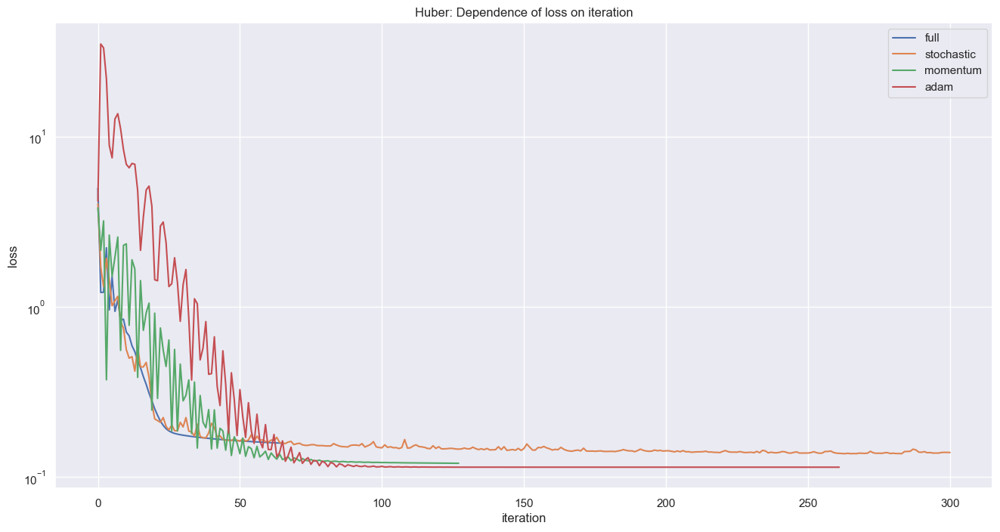

In [36]:
plt.figure(figsize=(16, 8))
for method in ['full', 'stochastic', 'momentum', 'adam']:
    plt.semilogy(history_huber[method], label = method)
plt.title('Huber: Dependence of loss on iteration')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.legend()
plt.show()

Будем сравнивать функции потерь в различных моделях используя статистики R_2 на тестовой и тренировочной выборке, так как смотреть на лосс будет не корректно.


Для Full:
- лучшим оказался MSE, так же число итераций для сходимости у него наименьшее.
- худшим оказался Huber, потому что 

Для Stochastic:
- лучшим оказался LogCosh
- остальные методы давали немного меньшую R_2

Для Momentum:
- лучшими оказались MSE и LogCosh
- худшим оказался MAE

Для Adam:
- лучшим оказался MSE
- худшим оказался MAE

Функция MSE - наиболее хорошая, так как распределение целевой переменной - нормальное, для других функций кажется не так это характерно.

Можно сделать вывод, что оптимальная функция потерь для данной задачи - MSE, на всех методах оптимизации она ведет себя неплохо, не зря является наиболее популярной, другие функции потерь бывает работают плохо.